---
title: "Using ColPali with Qdrant to index and search a UFO document dataset"
description: "Using Qdrant multivectors to index and search a UFO document dataset"
author: "Daniel van Strien"
date: "2024-10-02"
image: truth.png 
toc-depth: 3
categories: [computer-vision, huggingface]
---

**updates**

-  2024-10-30: Sabrina Esaquino from Qdrant made a very nice [video](https://youtu.be/_A90A-grwIc?si=MS5RV17D6sgirCRm) extending this blog post to use Binary Quantization to speed up the search process.

# Introduction

tl;dr: How can use [Qdrant](https://qdrant.tech/) + [ColPali](https://github.com/daniel-avn/colpali) to index and search a UFO dataset. 

ColPali is a new multimodal retrieval approach that aims to replace existing document retrievers, which often rely on an OCR step, with an end-to-end multimodal approach. This approach also aims to take into account the visual content and layout of the documents in addition to the textual content. 


In a [previous blog post](https://danielvanstrien.xyz/posts/post-with-code/colpali/2024-09-23-generate_colpali_dataset.html), I showed how a VLM can create synthetic data for fine-tuning a ColPali model. In this post, we will examine how to index and search a UFO dataset using Qdrant and ColPali. 


## Multivector Databases support

The last few years have seen an explosion of vector databases. These databases are optimized for storing and searching for high-dimensional data. Traditionally most of the vectors these databases have been storing are single-vector embeddings i.e a vector that looks like:

```python
[0.1, 0.2, 0.3, 0.4, 0.5]
```

These vectors can store rich representations of the data they are encoding. However, more recently, several new techniques have been proposed which don't rely on a single vector but instead use a set of vectors i.e. something like this:

```python
[[0.1, 0.2, 0.3, 0.4, 0.5], 
[0.1, 0.2, 0.3, 0.4, 0.5], 
[0.1, 0.2, 0.3, 0.4, 0.5]]
```

In the case of ColBERT, these multiple vectors represent the query and document tokens. These are then compared using a late interaction mechanism. This "late interaction" essentially means that rather than creating a pooled representation of the document and query, we compare each query token to each document token individually. 

This similarity has mostly been calculated using MaxSim, which takes the element-wise maximum similarity between the query and document tokens. ColPali uses a similar late interaction mechanism to compare the query and document tokens. The tl;dr is that instead of comparing a single vector to another single vector, we compare a set of vectors to another set of vectors. This approach is borrowed from ColBERT. The diagram below shows how this works in the case of ColBERT.

![Visual representation of ColBERT (source: https://www.answer.ai/posts/colbert-pooling.html)](https://www.answer.ai/posts/colbert_pooling/colbert.png)

I won't go into the details too much here, since [other posts](https://blog.vespa.ai/pretrained-transformer-language-models-for-search-part-3/) cover this already. Instead, I will show how we can use ColPali using the Qdrant vector database. 


### What is Qdrant?

Qdrant is a vector database. Many open-source and closed-source vector databases exist, and many "traditional" databases have also added support for vectors. 

Currently, only a small number of databases support multivectors. I am aware of the following:

- [Vespa](https://vespa.ai/)
- [Qdrant](https://qdrant.tech/)

From what I have understood, [Weaviate](https://weaviate.io/) has an example recipe for [ColPali](https://github.com/weaviate/recipes/blob/main/weaviate-features/named-vectors/NamedVectors-ColPali-POC.ipynb). However, they don't currently natively support MaxSim so using this in practice might be a bit more challenging.



::: {.callout-tip}
Vespa, and in particular, [Jo Kristian Bergum](https://x.com/jobergum), have done a lot of work on ColPali and are well worth following if you are interested in this area. It's on my list to finally try Vespa! 
:::


We'll start by installing the requirements. For the example, we'll use a local in-memory Qdrant DB, so you don't need to worry about any setup. You can easily swap this out for a remote DB or an on-disk DB if you want to use this approach in production.

In [ ]:
!pip install uv
!uv pip install --system colpali_engine>=0.3.1 datasets huggingface_hub[hf_transfer] qdrant-client transformers>=4.45.0 stamina rich

Audited 7 packages in 69ms


In [9]:
import os
import torch
import numpy as np
from qdrant_client import QdrantClient
from qdrant_client.http import models
from tqdm import tqdm
from datasets import load_dataset

We can set the `HF_HUB_ENABLE_HF_TRANSFER` environment variable to 1 to enable faster downloads. This is optional but should help if you have a fast connection.

In [ ]:
os.environ["HF_HUB_ENABLE_HF_TRANSFER"] = "1"

For this example blog, we'll use the [ufo-ColPali](https://huggingface.co/datasets/davanstrien/ufo-ColPali) dataset that I created as part of my [previous post](https://danielvanstrien.xyz/posts/post-with-code/colpali/2024-09-23-generate_colpali_dataset.html). If you have your own PDFs you want to work with you can use the [PDF to Page Images Dataset Space](https://huggingface.co/spaces/Dataset-Creation-Tools/pdf-to-page-images-dataset) to convert your PDFs into a Hugging Face dataset of page images. 

In [94]:
dataset = load_dataset("davanstrien/ufo-ColPali", split="train")

As a reminder of what the dataset looks like

In [95]:
dataset

Dataset({
    features: ['image', 'raw_queries', 'broad_topical_query', 'broad_topical_explanation', 'specific_detail_query', 'specific_detail_explanation', 'visual_element_query', 'visual_element_explanation', 'parsed_into_json'],
    num_rows: 2243
})

In this particular example, we'll just work with the images, but for many 'real world' document collections, you are likely to have at least some metadata associated with the documents that could also be indexed in the DB. These could include things like the title, author, date, etc. These additional metadata fields can also be used as part of the search query and for retrieval. 

Let's look at an example image to see what sort of data we are working with.

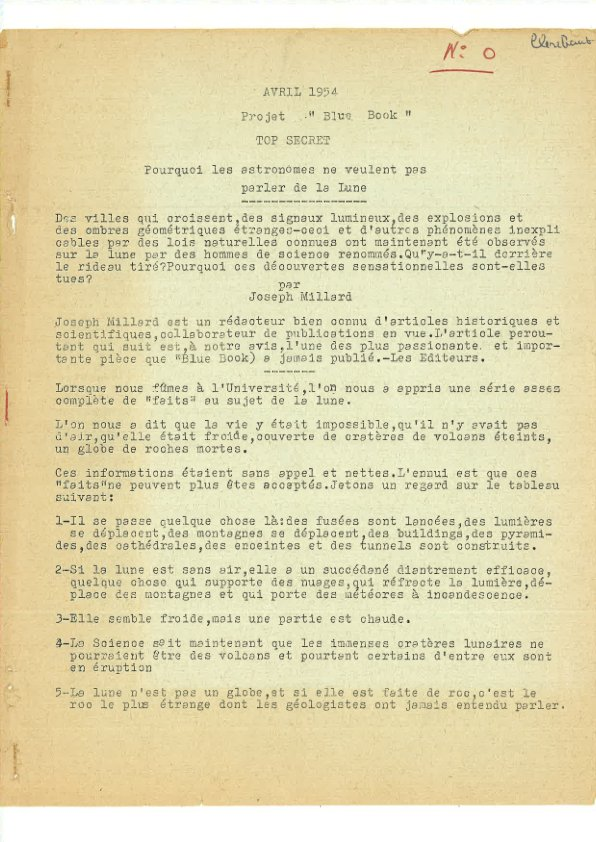

In [12]:
dataset[0]["image"]

## Indexing the dataset

Let's now walk through how to index the dataset using Qdrant. 


### Creating a Qdrant client

We can use the Qdrant Python client to interact with a Qdrant database. One of the nice features of this client is its in-memory implementation, which is very useful for testing. It's not recommended for production use, but it's great for getting started and means we can jump right into the code without having to worry about setting up a database.

In [10]:
# Only for colab, otherwise can load from a `.env` file or similar
# from google.colab import userdata

To prove that switching between the in-memory and remote clients is easy, the code below is all I need to use a DB running on a Qdrant cloud free tier. Qdrant is open source, so you can run it on your infrastructure. 


In [142]:
# qdrant_client = QdrantClient(
#     url="https://e25145aa-1e00-489a-948f-4633d3dd8a37.europe-west3-0.gcp.cloud.qdrant.io",
#     api_key=userdata.get('qdrantcloud'),
# )

collections=[CollectionDescription(name='ufo2'), CollectionDescription(name='ufo')]


In [113]:
qdrant_client = QdrantClient(
    ":memory:"
)  # Use ":memory:" for in-memory database or "path/to/db" for persistent storage

### Setting up the ColPali model

We'll use a ColPali model [davanstrien/finetune_colpali_v1_2-ufo-4bit](https://huggingface.co/davanstrien/finetune_colpali_v1_2-ufo-4bit) fine-tuned on the [ufo-ColPali](https://huggingface.co/datasets/davanstrien/ufo-ColPali) dataset. This model was trained using the excellent notebook in the [ColPali cookbooks repo](https://github.com/tonywu71/colpali-cookbooks) from [Tony Wu](https://huggingface.co/tonywu71).

If you want to use a standard ColPali model that is not optimized for UFO document retrieval, you may want to try the newly released [vidore/colqwen2-v0.1](https://huggingface.co/vidore/colqwen2-v0.1) model instead.


In [ ]:
# from colpali_engine.models import ColQwen2, ColQwen2Processor

# model = ColQwen2.from_pretrained(
#     "vidore/colqwen2-v0.1",
#     torch_dtype=torch.bfloat16,
#     device_map="cuda:0",  # or "mps" if on Apple Silicon
# )
# processor = ColQwen2Processor.from_pretrained("vidore/colqwen2-v0.1")


In [55]:
from colpali_engine.models import ColPali, ColPaliProcessor

# Initialize ColPali model and processor
model_name = (
    "davanstrien/finetune_colpali_v1_2-ufo-4bit"  # Use the latest version available
)
colpali_model = ColPali.from_pretrained(
    model_name,
    torch_dtype=torch.bfloat16,
    device_map="cuda:0",  # Use "cuda:0" for GPU, "cpu" for CPU, or "mps" for Apple Silicon
)
colpali_processor = ColPaliProcessor.from_pretrained(
    "vidore/colpaligemma-3b-pt-448-base"
)

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

### What is a multivector, and how do we use it in Qdrant?

To use multivectors in Qdrant, we need to specify the dimensions of the vectors. From the Qdrant docs:

> The length of the matrix is fixed, but the number of vectors in the matrix can be different for each point.

So, in order to use multivectors, we need to specify their length. We can check this by passing in an example image to the model and checking the shape of the output.

In [ ]:
sample_image = dataset[0]["image"]
with torch.no_grad():
    sample_batch = colpali_processor.process_images([sample_image]).to(
        colpali_model.device
    )
    sample_embedding = colpali_model(**sample_batch)

Since it's always fun to look at tensors, let's see what they output embeddings from the ColPali model looks like

In [17]:
sample_embedding

tensor([[[ 0.0093, -0.0045,  0.1445,  ...,  0.0248, -0.0820, -0.1641],
         [-0.0021,  0.1758,  0.1699,  ...,  0.0179, -0.0952, -0.1138],
         [-0.0237,  0.0366,  0.0732,  ...,  0.0449, -0.0918, -0.1738],
         ...,
         [-0.0588, -0.0243,  0.1650,  ..., -0.0703,  0.0767,  0.0486],
         [-0.1108,  0.0986,  0.1826,  ...,  0.0278, -0.0576, -0.0520],
         [-0.0693,  0.1123,  0.2207,  ...,  0.0172, -0.0679, -0.0830]]],
       device='cuda:0', dtype=torch.bfloat16)

and check the shape

In [18]:
sample_embedding.shape

torch.Size([1, 1030, 128])

As we can see, compared to a usual dense embedding, the output of the ColPali model is a multivector. We can see that the shape of the output is `(1, 1030, 128)`. We can check the length of the vectors by looking at the last dimension of the tensor. In this case, the length of the vectors is 128.

In [22]:
vector_size = sample_embedding.shape[2]
vector_size

128

# Create a collection in Qdrant with a multivector configuration

Now that we know the length of the vectors, we can create a collection in Qdrant using the correct configuration. 

Qdrant has a lot of knobs and dials that you can use to optimize the search for your particular use case. We'll see a few of these, but there are likely to be many more optimizations that you can still make. 

First, we define a name for our collection. If needed, we can store multiple collections in a single Qdrant instance. 

In [143]:
collection_name = "ufo"

We need to define several different parameters for the collection. One of these is the `VectorParams`. These let Qdrant know what size of vectors we want to store and what similarity metrics we want to use for comparing vectors. 
In this case, we also pass in a `MultivVectorConfig`, which tells Qdrant that we are storing multivectors. 

At the moment, Qdrant supports a single comparator for multivectors, `MaxSim`. A nice blog post goes through this in more detail [here](https://huggingface.co/blog/fsommers/document-similarity-colpali).



In [25]:
vector_params = models.VectorParams(
    size=vector_size,
    distance=models.Distance.COSINE,
    multivector_config=models.MultiVectorConfig(
        comparator=models.MultiVectorComparator.MAX_SIM
    ),
)

In [27]:
print(vector_params)

size=128 distance=<Distance.COSINE: 'Cosine'> hnsw_config=None quantization_config=None on_disk=None datatype=None multivector_config=MultiVectorConfig(comparator=<MultiVectorComparator.MAX_SIM: 'max_sim'>)


::: {.callout-tip}
There has been some dunking on Twitter about the potential cost of scaling multivector approaches. This is a big topic which I won't cover in detail in this post, but Jo Kristian Bergum ([jobergum](https://x.com/jobergum) on Twitter) wrote a great blog post on how to scale ColPali to billions of documents: [https://blog.vespa.ai/scaling-colpali-to-billions/](https://blog.vespa.ai/scaling-colpali-to-billions/). 

One of the possible optimizations discussed in this post was switching from using MaxSim to a hamming-based MaxSim that works using binary vectors. It is possible to convert the vectors from the ColPali model to binary vectors within Qdrant, but currently, they don't support this new similarity metric. 
:::




As mentioned above, one of the criticisms of ColPali and ColBert is that you suddenly need to store many more vectors. One way of reducing this with minimal performance degradation is to use some form of quantization. There are a few different approaches supported by Qdrant ([docs](https://qdrant.tech/documentation/guides/quantization/)). One of these is Scaler Quantization:

> Scalar quantization, in the context of vector search engines, is a compression technique that compresses vectors by reducing the number of bits used to represent each vector component.

> For instance, Qdrant uses 32-bit floating numbers to represent the original vector components. Scalar quantization allows you to reduce the number of bits used to 8. In other words, Qdrant performs float32 -> uint8 conversion for each vector component. Effectively, this means that the amount of memory required to store a vector is reduced by a factor of 4.

> In addition to reducing the memory footprint, scalar quantization also speeds up the search process. Qdrant uses a special SIMD CPU instruction to perform fast vector comparison. This instruction works with 8-bit integers, so the conversion to uint8 allows Qdrant to perform the comparison faster. [source](https://qdrant.tech/documentation/guides/quantization/#scalar-quantization)

We can define a `ScalarQuantizationConfig` and pass it when creating the collection. On the server side, Qdrant will convert the vectors to 8-bit integers, reducing the memory footprint and speeding up the search process. You can also switch on or off the `always_ram` parameter, keeping the vectors in RAM. This will increase performance at the cost of memory usage.

In [28]:
scalar_quant = models.ScalarQuantizationConfig(
    type=models.ScalarType.INT8,
    quantile=0.99,
    always_ram=False,
)

We can pass in all of these options when creating the collection. 

In [148]:
qdrant_client.recreate_collection(
    collection_name=collection_name,  # the name of the collection
    on_disk_payload=True,  # store the payload on disk
    optimizers_config=models.OptimizersConfigDiff(
        indexing_threshold=100
    ),  # it can be useful to swith this off when doing a bulk upload and then manually trigger the indexing once the upload is done
    vectors_config=models.VectorParams(
        size=vector_size,
        distance=models.Distance.COSINE,
        multivector_config=models.MultiVectorConfig(
            comparator=models.MultiVectorComparator.MAX_SIM
        ),
        quantization_config=models.ScalarQuantization(
            scalar=models.ScalarQuantizationConfig(
                type=models.ScalarType.INT8,
                quantile=0.99,
                always_ram=True,
            ),
        ),
    ),
)

<ipython-input-148-62e92350de50>:1: DeprecationWarning: `recreate_collection` method is deprecated and will be removed in the future. Use `collection_exists` to check collection existence and `create_collection` instead.
  qdrant_client.recreate_collection(


True

We define a helper function to upload points to Qdrant via the client. We use the `stamina` library to enable retries in case of network issues (I didn't have any issues with the in-memory client, but having this in place can be useful if you are doing a large upload).

In [149]:
import stamina


@stamina.retry(on=Exception, attempts=3)
def upsert_to_qdrant(batch):
    try:
        qdrant_client.upsert(
            collection_name=collection_name,
            points=points,
            wait=False,
        )
    except Exception as e:
        print(f"Error during upsert: {e}")
        return False
    return True

We will now upload the vectors to qdrant. We do this by creating batches of data, passing it through the ColPali model and then adding the embeddings to a qdrant `PointStruct`. If you have a smaller GPU you will likely want to reduce the batch size down a bit.

In [ ]:
batch_size = 6  # Adjust based on your GPU memory constraints

# Use tqdm to create a progress bar
with tqdm(total=len(dataset), desc="Indexing Progress") as pbar:
    for i in range(0, len(dataset), batch_size):
        batch = dataset[i : i + batch_size]

        # The images are already PIL Image objects, so we can use them directly
        images = batch["image"]

        # Process and encode images
        with torch.no_grad():
            batch_images = colpali_processor.process_images(images).to(
                colpali_model.device
            )
            image_embeddings = colpali_model(**batch_images)

        # Prepare points for Qdrant
        points = []
        for j, embedding in enumerate(image_embeddings):
            # Convert the embedding to a list of vectors
            multivector = embedding.cpu().float().numpy().tolist()
            points.append(
                models.PointStruct(
                    id=i + j,  # we just use the index as the ID
                    vector=multivector,  # This is now a list of vectors
                    payload={
                        "source": "internet archive"
                    },  # can also add other metadata/data
                )
            )
        # Upload points to Qdrant
        try:
            upsert_to_qdrant(points)
        # clown level error handling here 🤡
        except Exception as e:
            print(f"Error during upsert: {e}")
            continue

        # Update the progress bar
        pbar.update(batch_size)

print("Indexing complete!")

Indexing Progress:  25%|██▍       | 558/2243 [04:16<13:14,  2.12it/s]

If you had the indexing off during the upload you can trigger an index by setting a lower indexing threshold. 

In [ ]:
qdrant_client.update_collection(
    collection_name=collection_name,
    optimizer_config=models.OptimizersConfigDiff(indexing_threshold=10),
)

Let's take a look at some info about the collection (we'll use `rich` to make the output a bit nicer to look at)

In [118]:
from rich import print as r_print

collection = qdrant_client.get_collection(collection_name)
r_print(collection)

CollectionInfo(
    status=<CollectionStatus.GREEN: 'green'>,
    optimizer_status=<OptimizersStatusOneOf.OK: 'ok'>,
    vectors_count=None,
    indexed_vectors_count=0,
    points_count=2243,
    segments_count=1,
    config=CollectionConfig(
        params=CollectionParams(
            vectors=VectorParams(
                size=128,
                distance=<Distance.COSINE: 'Cosine'>,
                hnsw_config=None,
                quantization_config=None,
                on_disk=True,
                datatype=None,
                multivector_config=MultiVectorConfig(comparator=<MultiVectorComparator.MAX_SIM: 'max_sim'>)
            ),
            shard_number=None,
            sharding_method=None,
            replication_factor=None,
            write_consistency_factor=None,
            read_fan_out_factor=None,
            on_disk_payload=None,
            sparse_vectors=None
        ),
        hnsw_config=HnswConfig(
            m=16,
            ef_construct=100,
            full_scan_threshold=10000,
            max_indexing_threads=0,
            on_disk=None,
            payload_m=None
        ),
        optimizer_config=OptimizersConfig(
            deleted_threshold=0.2,
            vacuum_min_vector_number=1000,
            default_segment_number=0,
            max_segment_size=None,
            memmap_threshold=None,
            indexing_threshold=20000,
            flush_interval_sec=5,
            max_optimization_threads=1
        ),
        wal_config=WalConfig(wal_capacity_mb=32, wal_segments_ahead=0),
        quantization_config=None
    ),
    payload_schema={}
)

We can see a bunch of different info about the status of the collection, including a bunch of optimization configuration options we could adjust. You'll also see currently, no vectors are indexed. These vectors will be indexed in the background, but we can already start searching.

::: {.callout-tip}
Depending on your hardware, the initial indexing might take some time. I found that sometimes the `QdrantClient` could timeout while the indexing was in progress. When interacting with the client, you can adjust the timeout by passing in a `timeout` parameter. This usually resolves any issues with not getting results back. If you are using Qdrant in production, you will want to ensure you have a sensible timeout and that if you are getting timeouts, they are fixed by ensuring the DB is configured well for your use case.
:::

### Searching our UFO database

Now that we have uploaded the vectors to Qdrant we can start searching. To start we can use the scroll method to just get the first 10 results.

In [119]:
qdrant_client.scroll(collection_name=collection_name, limit=10)

([Record(id=0, payload={}, vector=None, shard_key=None, order_value=None),
  Record(id=1, payload={}, vector=None, shard_key=None, order_value=None),
  Record(id=2, payload={}, vector=None, shard_key=None, order_value=None),
  Record(id=3, payload={}, vector=None, shard_key=None, order_value=None),
  Record(id=4, payload={}, vector=None, shard_key=None, order_value=None),
  Record(id=5, payload={}, vector=None, shard_key=None, order_value=None),
  Record(id=6, payload={}, vector=None, shard_key=None, order_value=None),
  Record(id=7, payload={}, vector=None, shard_key=None, order_value=None),
  Record(id=8, payload={}, vector=None, shard_key=None, order_value=None),
  Record(id=9, payload={}, vector=None, shard_key=None, order_value=None)],
 10)

Let's see how we can query the DB. We first need to process our query text using the `process_queries` method. We then pass this through the model to get the embeddings.

In [120]:
query_text = "top secret"
with torch.no_grad():
    batch_query = colpali_processor.process_queries([query_text]).to(
        colpali_model.device
    )
    query_embedding = colpali_model(**batch_query)
query_embedding

tensor([[[ 0.1494, -0.0186,  0.0889,  ..., -0.0186, -0.0767, -0.0330],
         [-0.0830, -0.1094,  0.0447,  ..., -0.0078, -0.0928,  0.0835],
         [-0.1167, -0.0349,  0.0649,  ..., -0.0093,  0.0022, -0.0206],
         ...,
         [-0.0688,  0.0322,  0.0532,  ...,  0.0188,  0.0479,  0.0430],
         [-0.0752,  0.0295,  0.0471,  ...,  0.0199,  0.0493,  0.0267],
         [-0.0564,  0.0530,  0.0635,  ..., -0.0029,  0.0486,  0.0173]]],
       device='cuda:0', dtype=torch.bfloat16)

Let's see what the output of the model looks like

In [121]:
query_embedding[0].shape

torch.Size([16, 128])

We need to put the embeddings on the CPU and convert them to a list which we can pass to the Qdrant client. 

In [122]:
# Convert the query embedding to a list of vectors
multivector_query = query_embedding[0].cpu().float().numpy().tolist()

We use the `query_points` method to search the DB. We can pass in a number of different parameters to control the search. In this case we''ll just limit the number of results to 10.

In [124]:
# Search in Qdrant
search_result = qdrant_client.query_points(
    collection_name=collection_name, query=multivector_query, limit=10, timeout=60
)

search_result.points

[ScoredPoint(id=2178, version=0, score=12.130735098964559, payload={}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=1381, version=0, score=12.022836438326163, payload={}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=928, version=0, score=11.337400593495904, payload={}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=2235, version=0, score=11.24344362149126, payload={}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=2026, version=0, score=10.998634505160364, payload={}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=528, version=0, score=10.956125884478812, payload={}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=1370, version=0, score=10.878949565786773, payload={}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=0, version=0, score=10.854501769864028, payload={}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=1964, version=0, score=10.517656939461

What did we actually get back? We can see the results are a list of `PointStruct` objects. We can see the `id` of the document, the `distance` from the query and the `payload`, which is the metadata associated with the document. 

When we uploaded the data to Qdrant, we just used the index of the rows in the original dataset as the document's `ID`. This means we can easily look up the original document in the dataset. Let's see what we find when searching for "top secret".

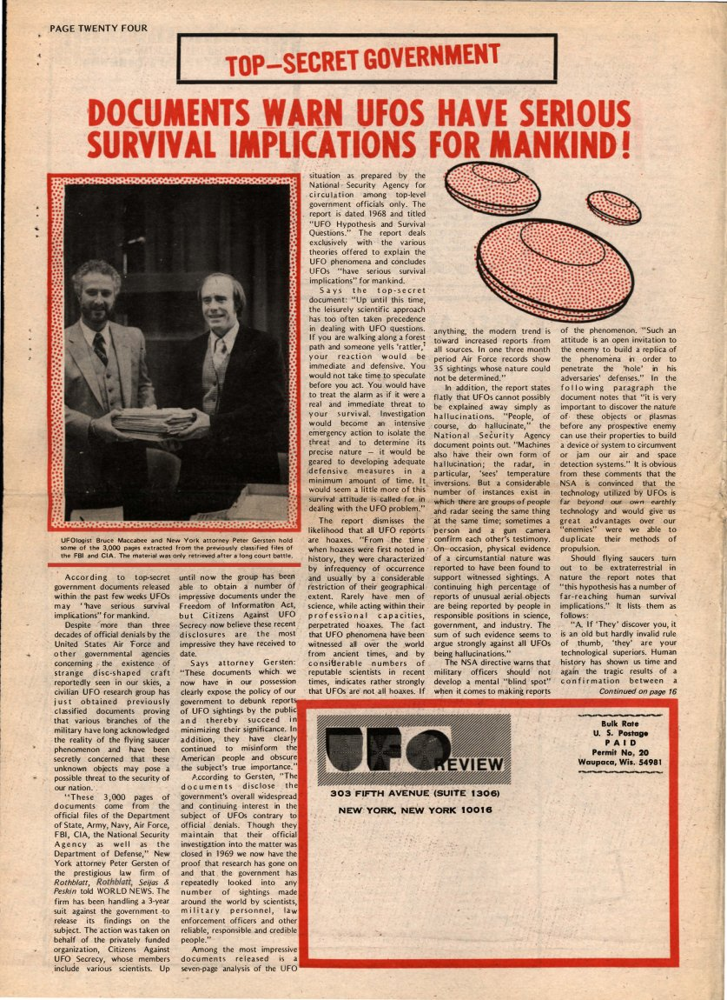

In [128]:
idx = search_result.points[0].id
dataset[idx]["image"]

Looks pretty top secret! We can also wrap this up in a nice function to make it easier to search the DB.

In [129]:
def search_images_by_text(query_text, top_k=5):
    # Process and encode the text query
    with torch.no_grad():
        batch_query = colpali_processor.process_queries([query_text]).to(
            colpali_model.device
        )
        query_embedding = colpali_model(**batch_query)

    # Convert the query embedding to a list of vectors
    multivector_query = query_embedding[0].cpu().float().numpy().tolist()
    # Search in Qdrant
    search_result = qdrant_client.query_points(
        collection_name=collection_name, query=multivector_query, limit=top_k
    )

    return search_result


# Example usage
query_text = "declassified data"
results = search_images_by_text(query_text)

for result in results.points:
    print(result)

id=67 version=0 score=12.138390401267928 payload={} vector=None shard_key=None order_value=None
id=65 version=0 score=11.913804148078945 payload={} vector=None shard_key=None order_value=None
id=64 version=0 score=11.10246256038046 payload={} vector=None shard_key=None order_value=None
id=40 version=0 score=10.984743759976059 payload={} vector=None shard_key=None order_value=None
id=59 version=0 score=10.78073398079465 payload={} vector=None shard_key=None order_value=None


and in this case, we can also return the images from the dataset

In [137]:
def search_by_text_and_return_images(query_text, top_k=5):
    results = search_images_by_text(query_text, top_k)
    row_ids = [r.id for r in results.points]
    return dataset.select(row_ids)

Let's take a look at a few more results for "top secret" 

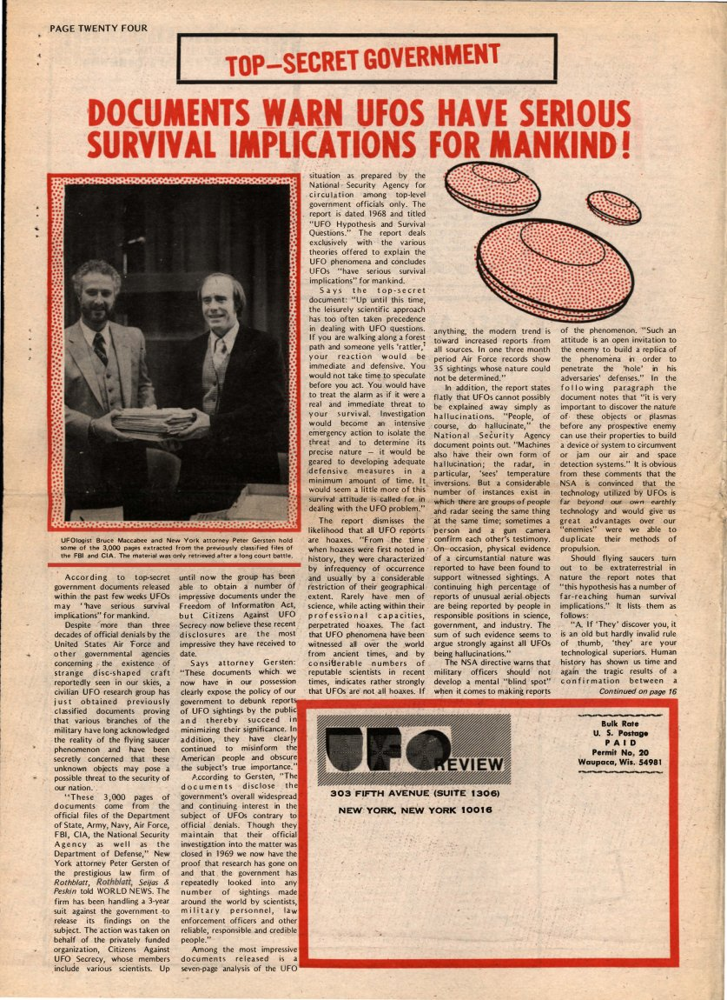

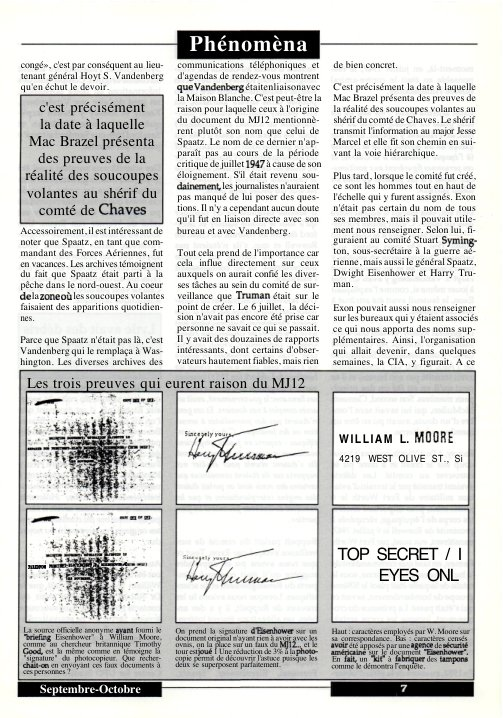

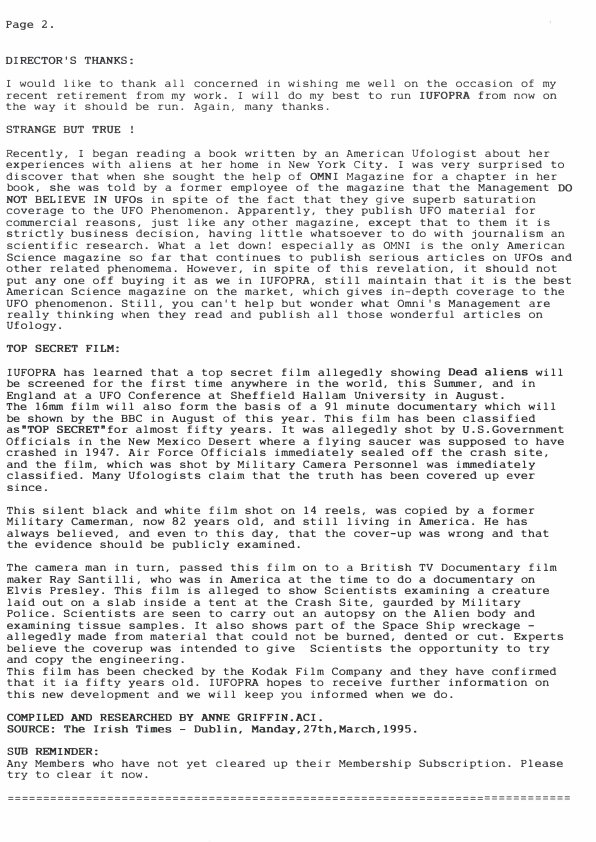

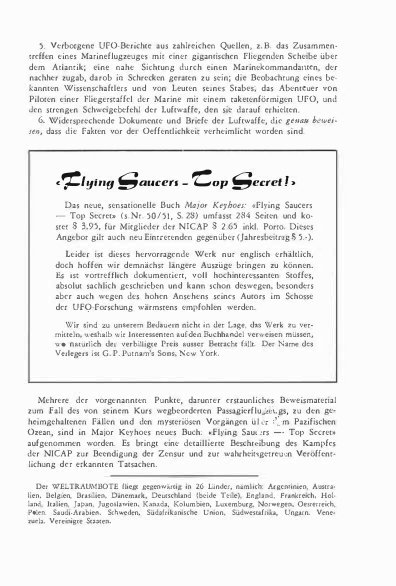

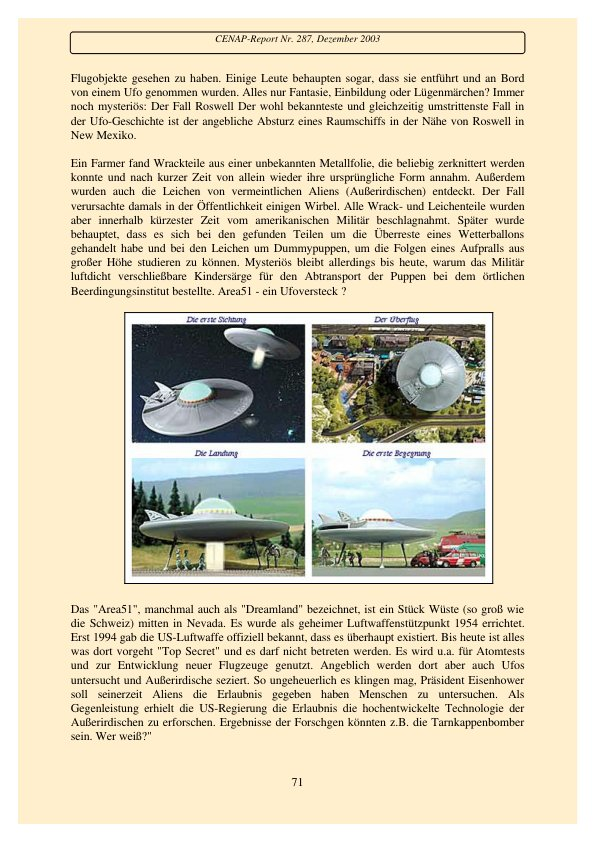

In [138]:
results_ds = search_by_text_and_return_images("top secret")

for row in results_ds:
    # display image
    display(row["image"])

### ColPali vs OCR

Here are a couple of notes on these results. The use case here is obviously a bit of a toy example since we only index a relatively small number of documents, but even in these results, we see some examples of why ColPali is such an intriguing approach.

![I always cite my memes: https://x.com/jobergum/status/1839915957298315424](meme.png)

#### Weird fonts 

One of the challenges of traditional document retrieval is that there is often a complex pipeline of layout recognition, line segmentation, OCR, etc. This approach works well on simple documents but fails on more complex ones. It might be worthwhile and practical to develop a custom pipeline for your documents if you have very consistent document layouts. However, if you have a lot of different document layouts this can be very challenging. 

One of the areas where OCR can often struggle is with weird fonts. For example in one of our results, we had this:

![Example of a heading font that is useful for retreival](font.png)

It's possible some OCR engines would correctly parse this, but this kind of text can trip up OCR engines. Some missing text might not always be important, but weird fonts are often used to highlight important information or as headings. In this case, the ColPali model has no problem with this heading font. 


#### Layout 

Another area where OCR engines and traditional layout methods struggle is with documents which contain tables or other complex layouts. For example, in one of our results, we had this:

![Example where text is in a table that might confuse an OCR engine](layout.png)

Whilst there are models for doing layout recognition on tables, these can be quite complex and often require a lot of manual intervention. It is almost certainly worth doing this work if you want to *extract* the information from this document but it's sometimes sufficient just to *retrieve* the document and either pass it to another model or (shock horror) have a human look at it. In this case, the ColPali model has no problem with the layout of the document.


## Conclusion 

ColPali remains a relatively novel approach to retrieval, and it's likely to take some time for all vector DBs to implement proper support for multi-vectors. The community is likely to also discover new optimization approaches to both the ColPali model itself and its integration with vector DBs.

I left some further resources below and am happy to get feedback on any improvements I can make to this blog post.



### Further resources

- Hugging Face Hub organization for the ColPali authors: https://huggingface.co/vidore
- Blog post on the rise of vision-driven document retrieval for RAG: https://blog.vespa.ai/the-rise-of-vision-driven-document-retrieval-for-rag/
- Blog post on scaling ColPali using the Vespa database: https://blog.vespa.ai/scaling-colpali-to-billions/


### Bonus tips

A few other things I think are worth exploring if you plan to use this in a production setting.

#### Pre-filtering 

It's likely in many real use cases that you either have, or can create, some metadata for your documents. These can also be indexed in Qdrant and may help improve the search results and performance of the a multivector approach. If for example, you can filter to remove all documents before/after a certain date, you can reduce the amount of vectors that Qdrant needs to search through. 

### Combining vectors

It's also possible to use other vectors for the same points in Qdrant. For example, you may want to use a dense vector to store a representation of the text extracted through an existing OCR pipeline (if you already have this to hand it's worth trying to use it), you can then use these vectors do a first large search and then use the multivector embeddings to do a second stage search limited only to results from the first step. See the [filtering docs](https://qdrant.tech/documentation/concepts/filtering/#has-id) for more info on how to do this. This could look something like:

- search for "top secret" using the dense vectors and get the top 1000 results
- search for "top secret" using the multivectors but only search in the top 1000 results from the first search 


#### Binary Quantization
It's very likely to make sense to explore using Binary Quantization for storing your vectors since it can reduce the memory footprint and speed up the search process. You can set this up by doing something like this in the collection creation step

In [ ]:
quantization_config = models.BinaryQuantization(
    binary=models.BinaryQuantizationConfig(
        always_ram=True,
    )
)

### Some more search examples

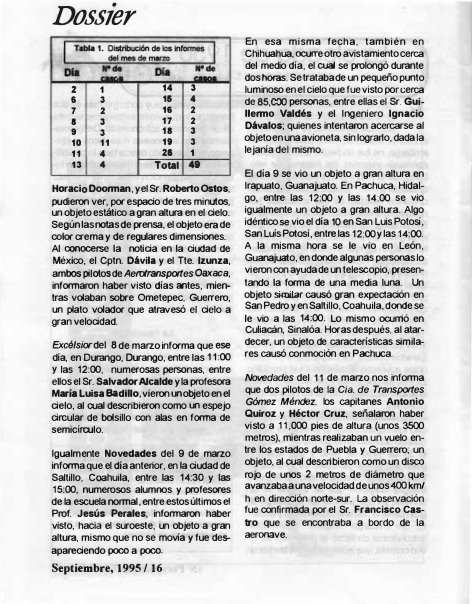

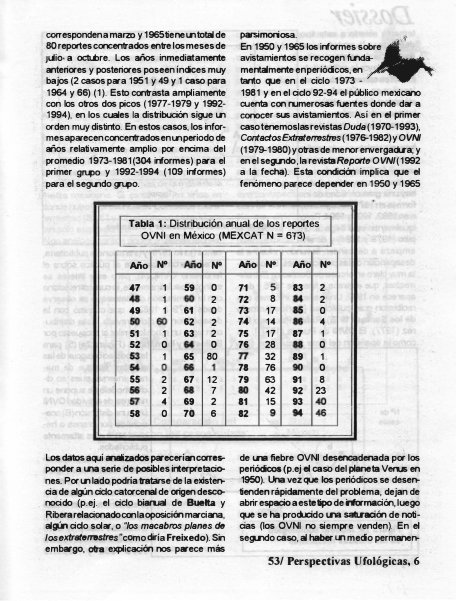

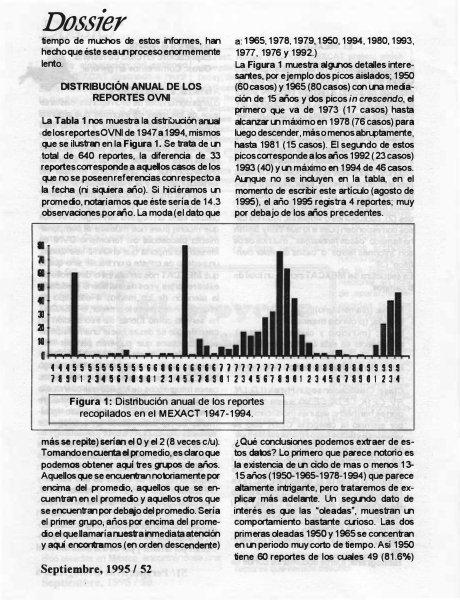

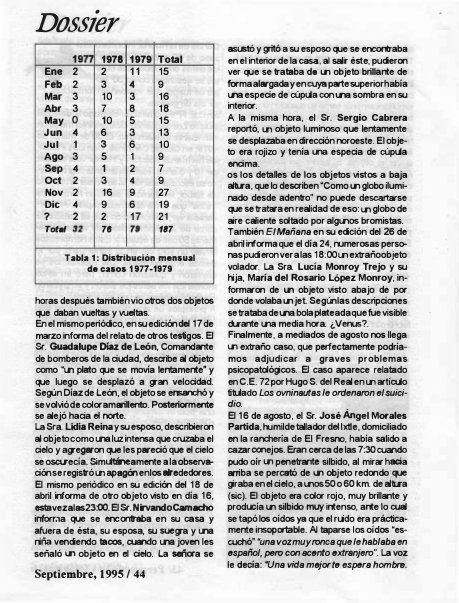

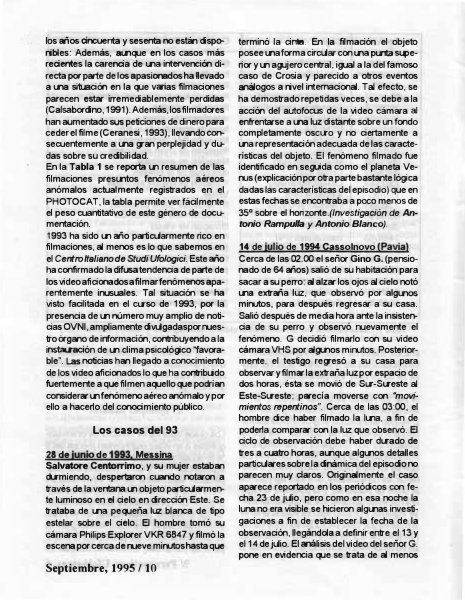

In [140]:
results_ds = search_by_text_and_return_images("sightings data table")

for row in results_ds:
    # display image
    display(row["image"])

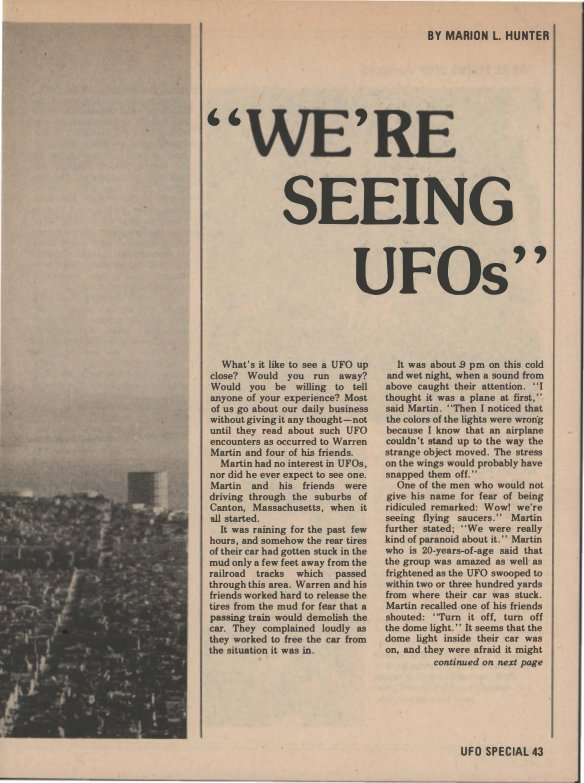

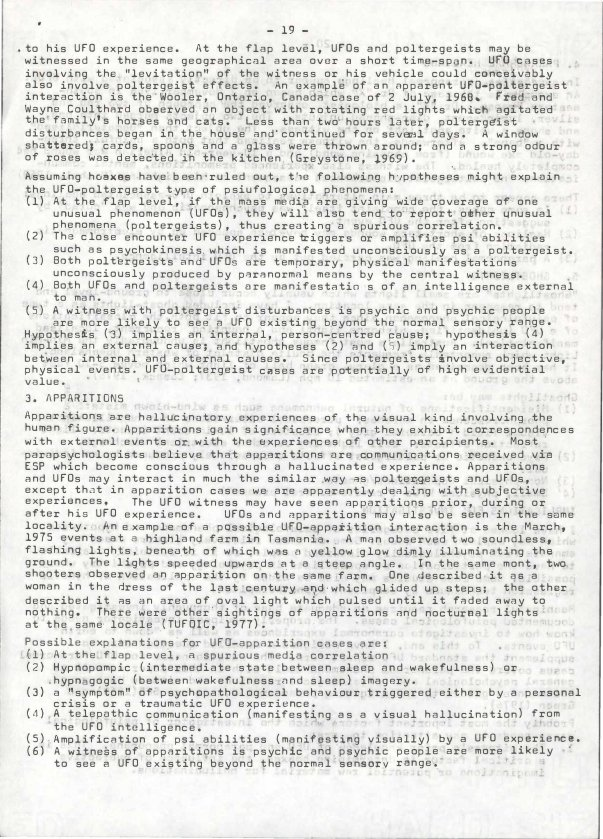

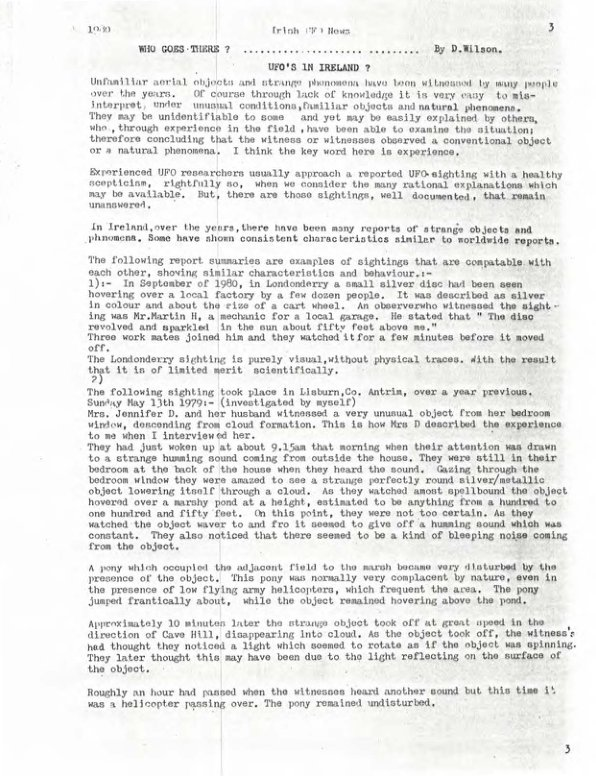

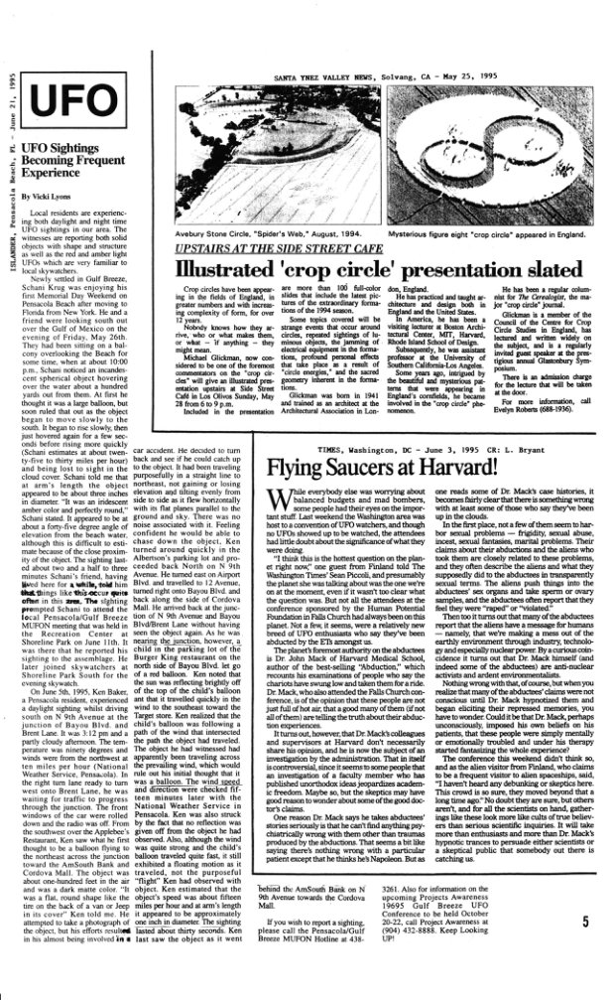

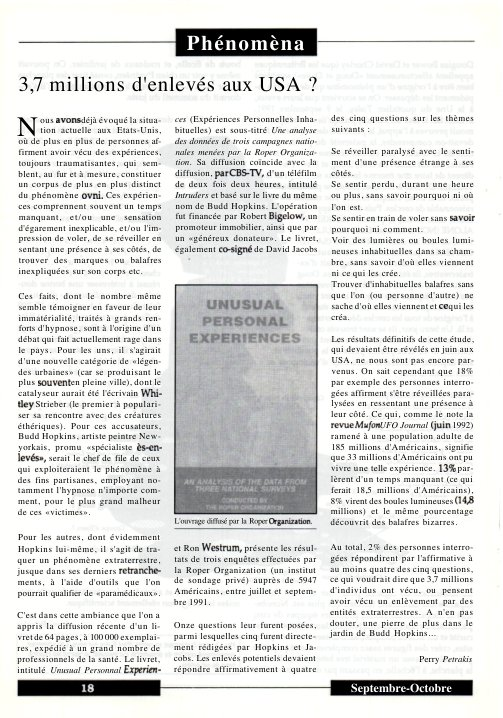

In [141]:
results_ds = search_by_text_and_return_images("ufo experiences")
for row in results_ds:
    display(row["image"])

## Glossary

- **ColPali**: A multimodal retrieval approach for document search.

- **Qdrant**: An open-source vector database.

- **Vector Database**: A database optimized for storing and searching high-dimensional vector data.

- **Multivector**: A set of vectors used to represent a single item, as opposed to a single vector.

- **Late Interaction**: A mechanism used in ColPali to compare query and document tokens individually at query time.

- **MaxSim**: A similarity calculation method used in ColPali and ColBERT.

- **Quantization**: A compression technique used to reduce the memory footprint of vectors.

- **Scalar Quantization**: A specific type of quantization that reduces the number of bits used to represent vector components.

- **OCR (Optical Character Recognition)**: Technology used to convert images of text into machine-readable text.

- **VLM (Vision Language Model)**: A type of AI model that can process both image and text data.

- **Multimodal**: Relating to multiple modes of data, such as text and images.

- **Embedding**: A numerical representation of data in a vector space.

- **Cosine Similarity**: A measure of similarity between two vectors.

- **Indexing**: The process of organizing data in a database to optimize search and retrieval.

- **Binary Quantization**: A form of quantization that converts vectors to binary (0 or 1) values.

- **RAG (Retrieval-Augmented Generation)**: A technique that combines retrieval of relevant information with text generation.